In [1]:
import torchvision as tv
import phototour
import torch
from tqdm import tqdm 
import numpy as np
import torch.nn as nn
import math 
import tfeat_model
import torch.optim as optim
import torch.nn.functional as F
import torch.backends.cudnn as cudnn
import os


In [2]:
#init tfeat and load the trained weights
tfeat = tfeat_model.TNet()
models_path = '../pretrained-models'
net_name = 'tfeat-notredame'
tfeat.load_state_dict(torch.load(os.path.join(models_path,net_name+".params")))
# tfeat.cuda()
tfeat.eval()
all_good_matches = []

(1024, 768)
81


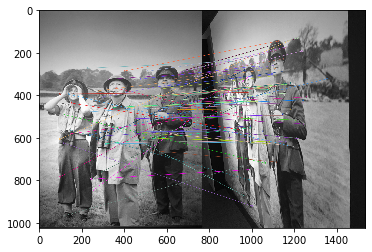

Wall time: 798 ms


(<matplotlib.image.AxesImage at 0x25d07543160>, None)

In [3]:
%%time

import cv2
import tfeat_utils
import numpy as np
import cv2
from matplotlib import pyplot as plt


img1 = cv2.imread('../imgs/v_churchill/1.ppm',0) 
img2 = cv2.imread('../imgs/v_churchill/6.ppm',0)
print(img1.shape)
brisk = cv2.BRISK_create()
kp1, des1 = brisk.detectAndCompute(img1,None)
kp2, des2 = brisk.detectAndCompute(img2,None)

bf = cv2.BFMatcher(cv2.NORM_HAMMING)
matches = bf.knnMatch(des1,des2, k=2)
# Apply ratio test
good = []
for m,n in matches:
    if m.distance < 0.8*n.distance:
        good.append([m])
print(len(good))      
img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
plt.imshow(img3),plt.show()

78


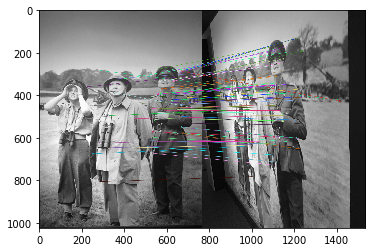

Wall time: 2.51 s


(<matplotlib.image.AxesImage at 0x25d0749e8d0>, None)

In [4]:
%%time

# mag_factor is how many times the original keypoint scale
# is enlarged to generate a patch from a keypoint
mag_factor = 3
desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

bf = cv2.BFMatcher(cv2.NORM_L2)
matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
# Apply ratio test
good = []
for m,n in matches:
    if m.distance < 0.8*n.distance:
        good.append([m])

print(len(good))
img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)

plt.imshow(img3),plt.show()

********************************************************************
28


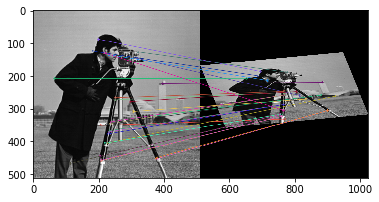

62


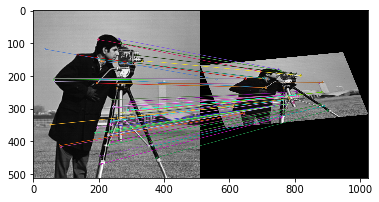

##########################################################################
39


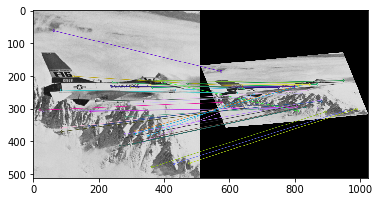

62


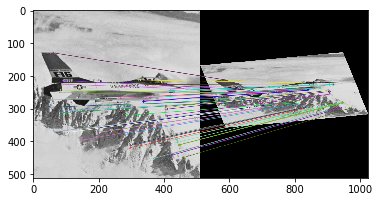

##########################################################################
25


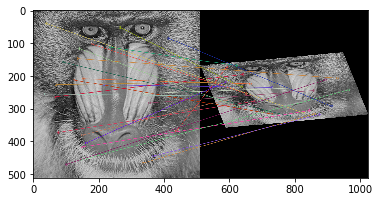

46


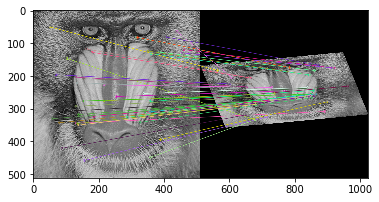

##########################################################################
24


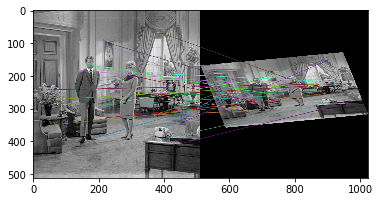

75


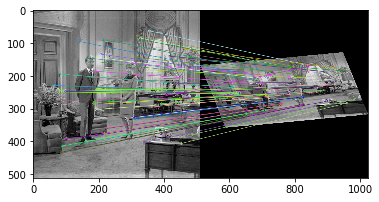

##########################################################################
17


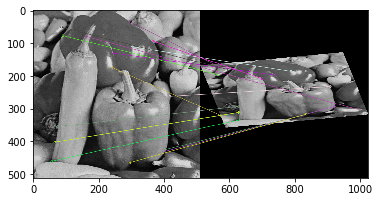

38


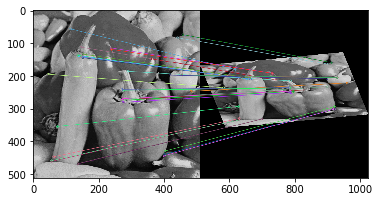

##########################################################################
39


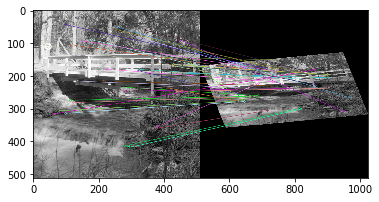

31


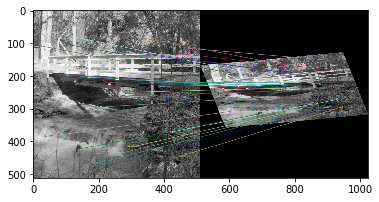

##########################################################################
13


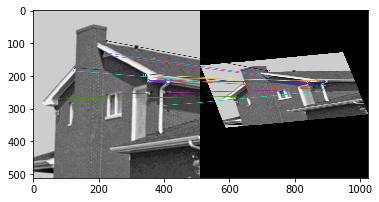

30


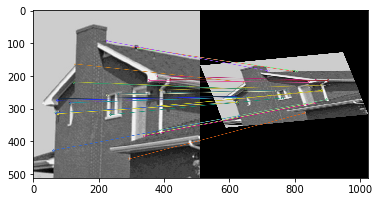

##########################################################################
17


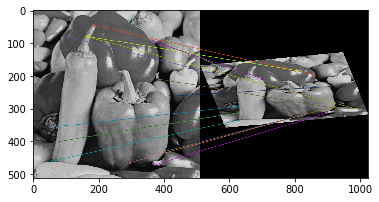

38


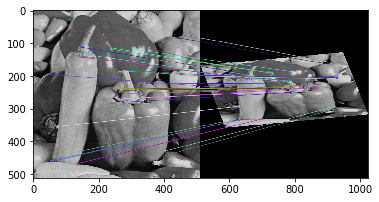

##########################################################################
29


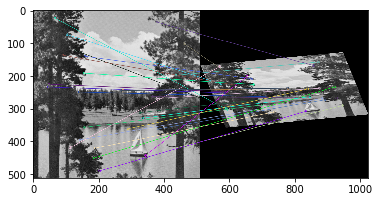

24


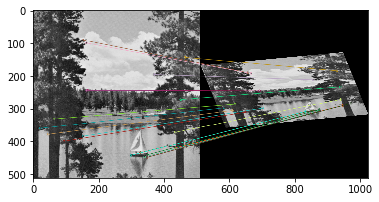

##########################################################################
33


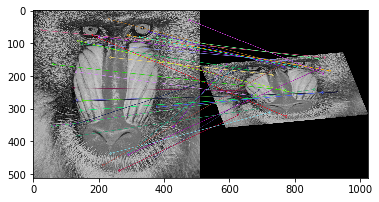

38


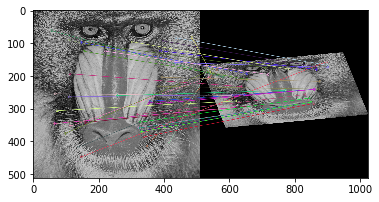

##########################################################################
38


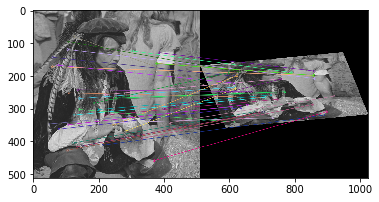

44


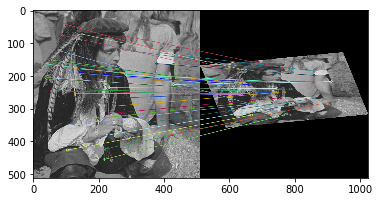

##########################################################################
[[(28, 62), (39, 62), (25, 46), (24, 75), (17, 38), (39, 31), (13, 30), (17, 38), (29, 24), (33, 38), (38, 44)]]


In [22]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1
method_goods=[]
for root,dirs,files in os.walk("../standard_test_images"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    print("********************************************************************")
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file, 0) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file, 0)
        even += 1
        
        brisk = cv2.BRISK_create()
        kp1, des1 = brisk.detectAndCompute(img1,None)
        kp2, des2 = brisk.detectAndCompute(img2,None)

        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
        one_good_pair=()
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good)) 
        one_good_pair = one_good_pair + (len(good),)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()

        desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
        desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

        bf = cv2.BFMatcher(cv2.NORM_L2)
        matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        method_goods.append(one_good_pair)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()
        print("##########################################################################")
    all_good_matches.append(method_goods)
    print(all_good_matches)

105


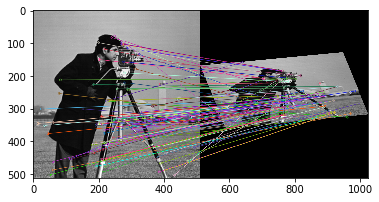

97


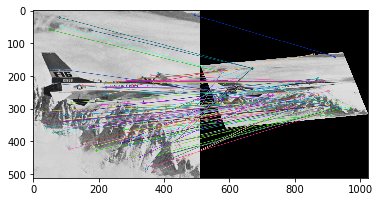

72


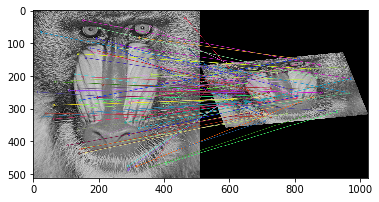

130


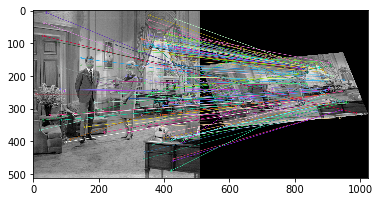

67


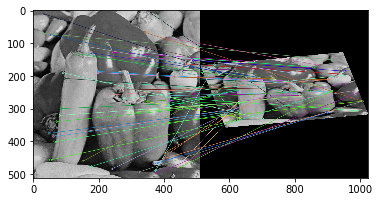

97


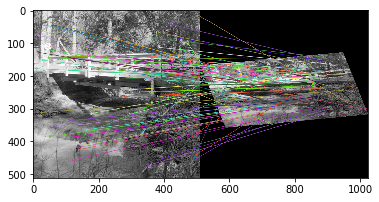

66


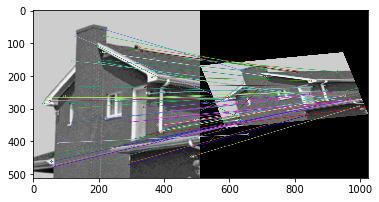

65


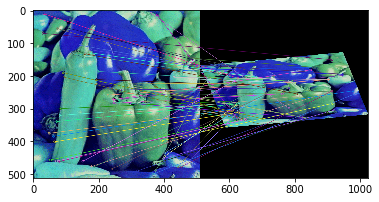

111


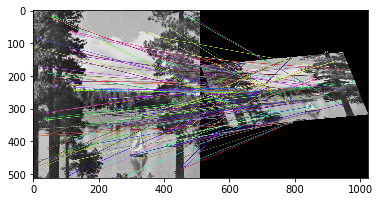

51


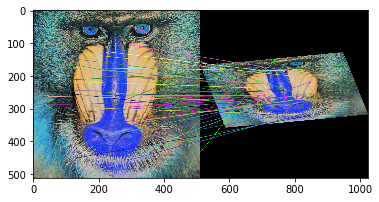

95


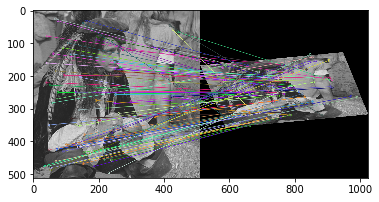

In [23]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1

for root,dirs,files in os.walk("../standard_test_images"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file)
        even += 1
        
        sift = cv2.xfeatures2d.SIFT_create()
        kp1, des1 = sift.detectAndCompute(img1,None)
        kp2, des2 = sift.detectAndCompute(img2,None)

        ##bf = cv2.BFMatcher(cv2.NORM_HAMMING)
        ##matches = bf.knnMatch(des1,des2, k=2)
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)

# Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good))      
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()
        
        

********************************************************************
105


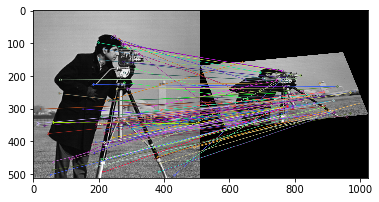

126


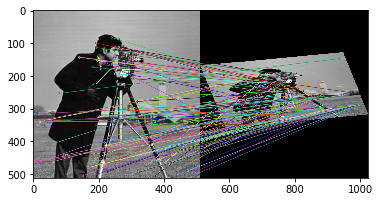

##########################################################################
97


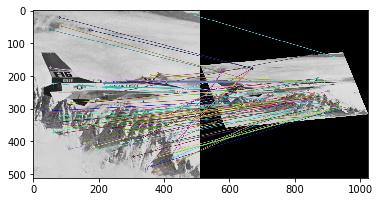

103


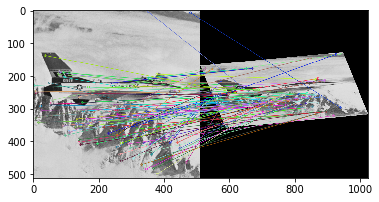

##########################################################################
72


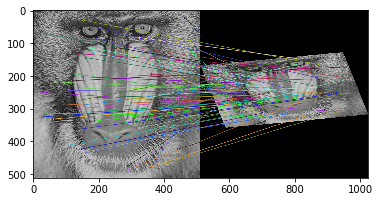

273


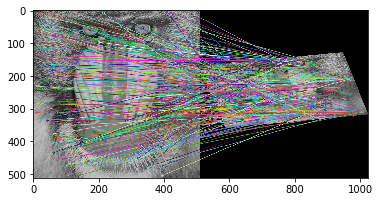

##########################################################################
130


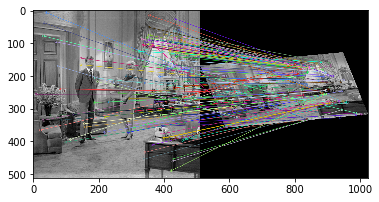

146


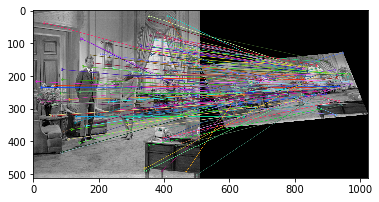

##########################################################################
67


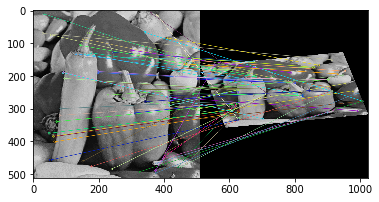

38


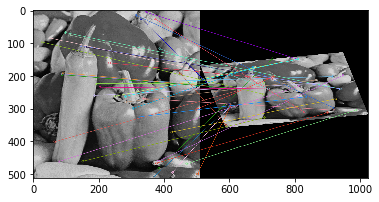

##########################################################################
97


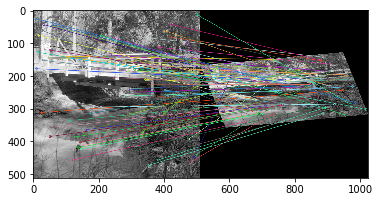

85


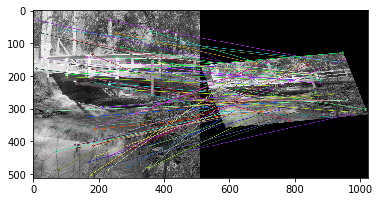

##########################################################################
66


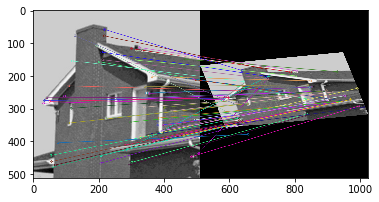

50


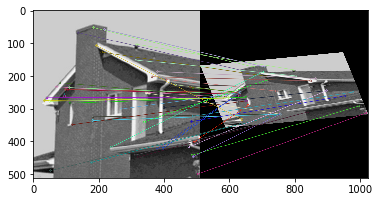

##########################################################################
65


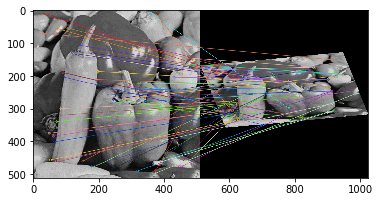

40


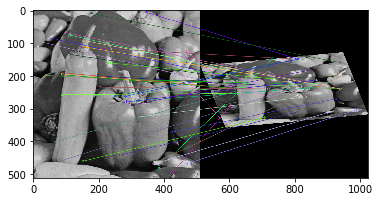

##########################################################################
111


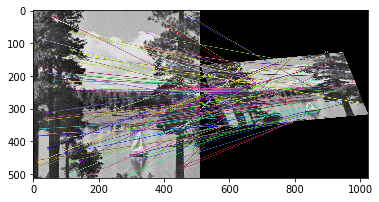

85


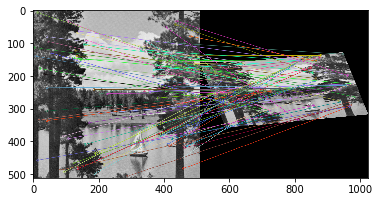

##########################################################################
51


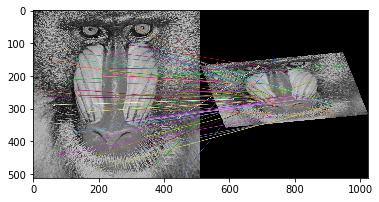

61


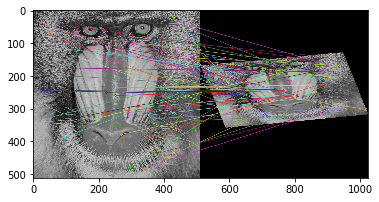

##########################################################################
95


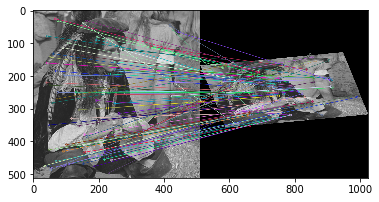

70


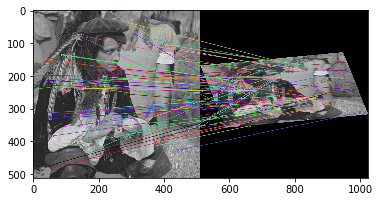

##########################################################################
[[(28, 62), (39, 62), (25, 46), (24, 75), (17, 38), (39, 31), (13, 30), (17, 38), (29, 24), (33, 38), (38, 44)], [(105, 126), (97, 103), (72, 273), (130, 146), (67, 38), (97, 85), (66, 50), (65, 40), (111, 85), (51, 61), (95, 70)]]


In [24]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1
method_goods=[]
for root,dirs,files in os.walk("../standard_test_images"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    print("********************************************************************")
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file, 0) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file, 0)
        even += 1
        
        sift = cv2.xfeatures2d.SIFT_create()
        kp1, des1 = sift.detectAndCompute(img1,None)
        kp2, des2 = sift.detectAndCompute(img2,None)
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
        one_good_pair=()
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()

        desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
        desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

        bf = cv2.BFMatcher()
        matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        method_goods.append(one_good_pair)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)

        plt.imshow(img3),plt.show()
        print("##########################################################################")
    all_good_matches.append(method_goods)
    print(all_good_matches)

********************************************************************
131


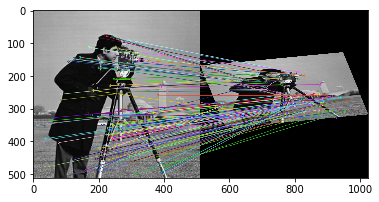

56


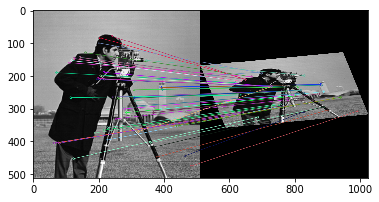

##########################################################################
102


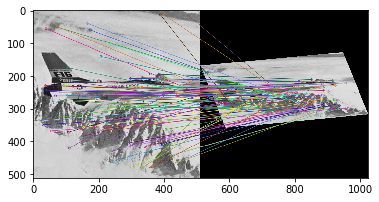

36


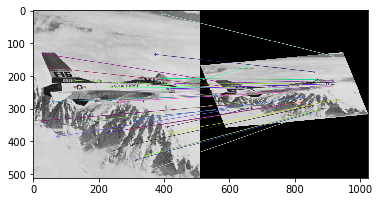

##########################################################################
133


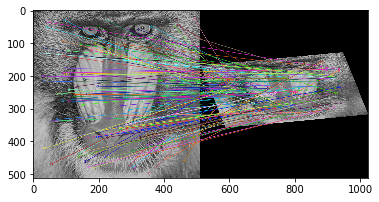

68


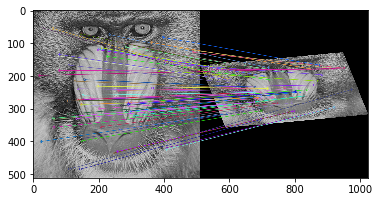

##########################################################################
176


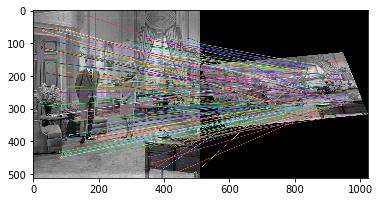

74


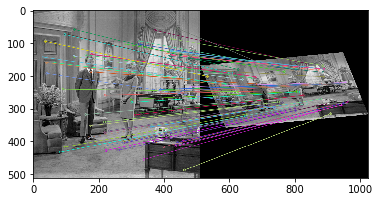

##########################################################################
152


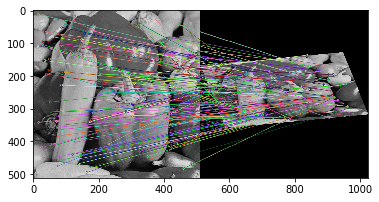

62


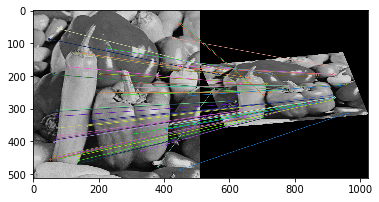

##########################################################################
115


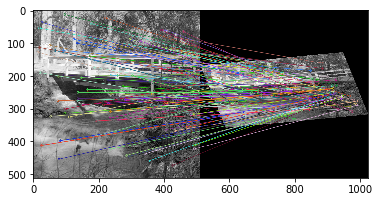

20


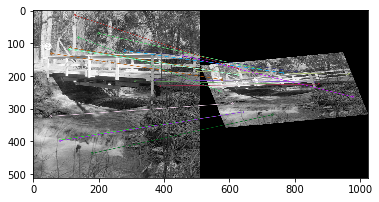

##########################################################################
140


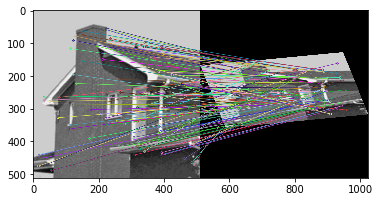

58


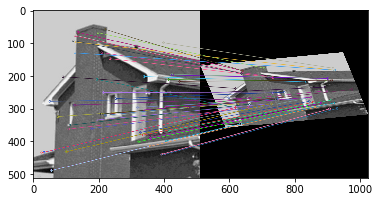

##########################################################################
144


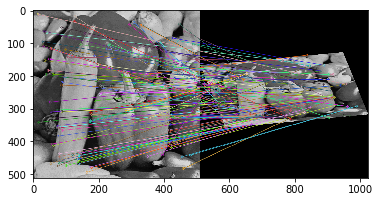

53


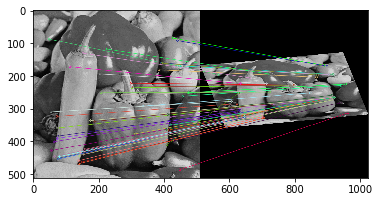

##########################################################################
115


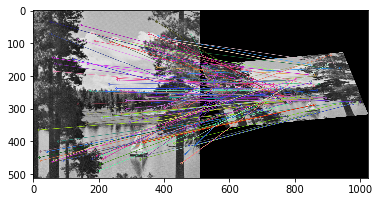

21


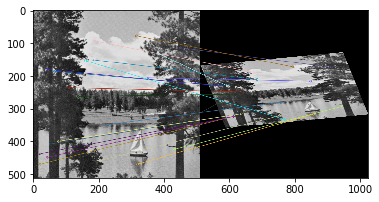

##########################################################################
159


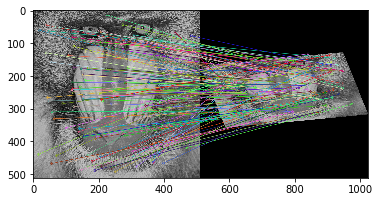

84


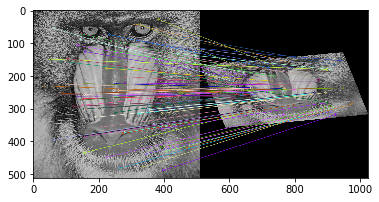

##########################################################################
141


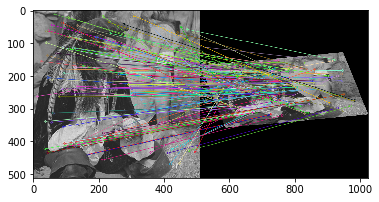

44


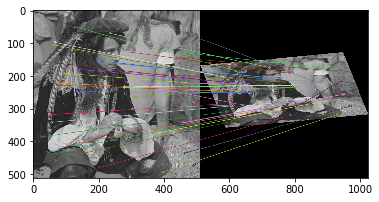

##########################################################################
[[(28, 62), (39, 62), (25, 46), (24, 75), (17, 38), (39, 31), (13, 30), (17, 38), (29, 24), (33, 38), (38, 44)], [(105, 126), (97, 103), (72, 273), (130, 146), (67, 38), (97, 85), (66, 50), (65, 40), (111, 85), (51, 61), (95, 70)], [(131, 56), (102, 36), (133, 68), (176, 74), (152, 62), (115, 20), (140, 58), (144, 53), (115, 21), (159, 84), (141, 44)]]


In [25]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1
method_goods=[]
for root,dirs,files in os.walk("../standard_test_images"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    print("********************************************************************")
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file, 0) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file, 0)
        even += 1
        
        surf = cv2.xfeatures2d.SURF_create()
        kp1, des1 = surf.detectAndCompute(img1,None)
        kp2, des2 = surf.detectAndCompute(img2,None)
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
        one_good_pair=()
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()

        desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
        desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

        bf = cv2.BFMatcher()
        matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        method_goods.append(one_good_pair)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)

        plt.imshow(img3),plt.show()
        print("##########################################################################")
    all_good_matches.append(method_goods)
    print(all_good_matches)

********************************************************************
34


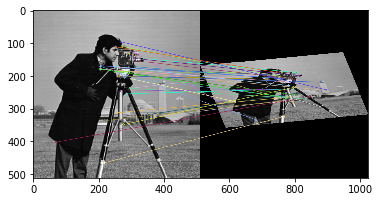

13


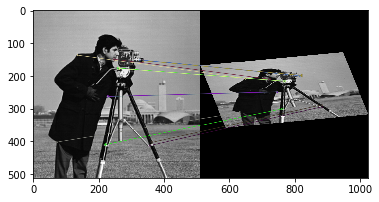

##########################################################################
36


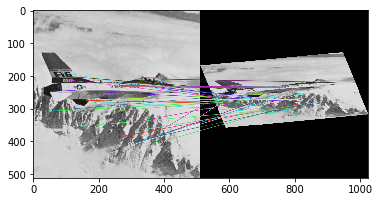

11


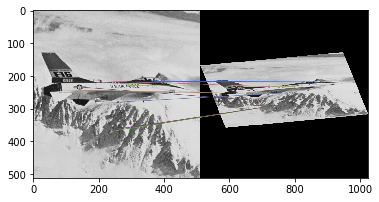

##########################################################################
26


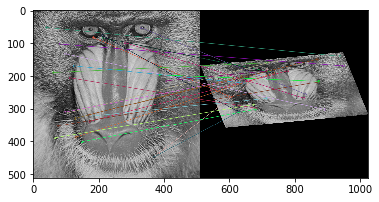

11


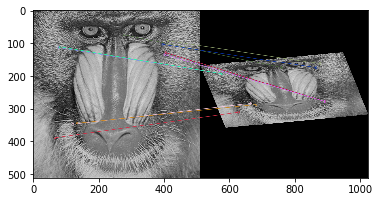

##########################################################################
41


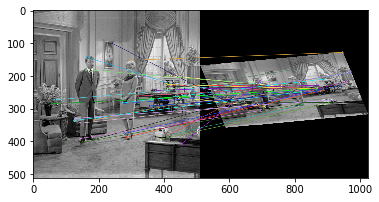

4


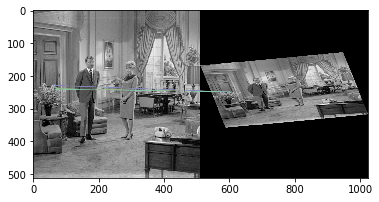

##########################################################################
52


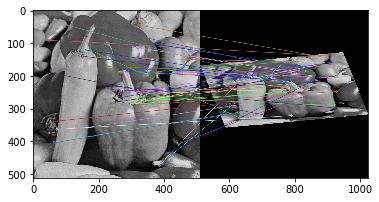

4


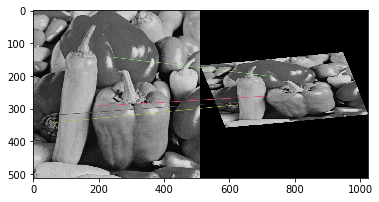

##########################################################################
32


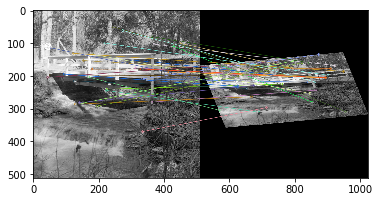

10


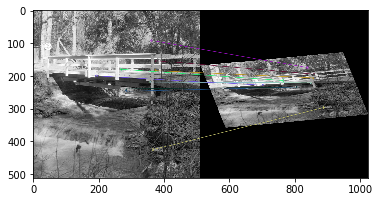

##########################################################################
22


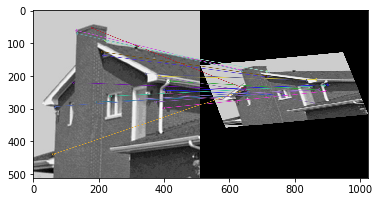

16


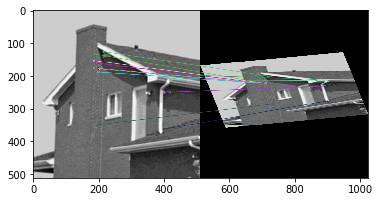

##########################################################################
56


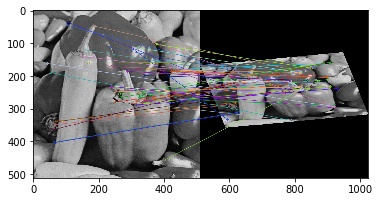

5


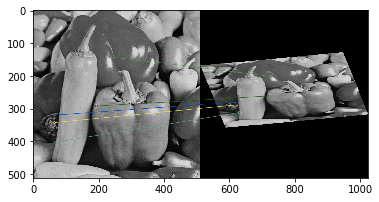

##########################################################################
42


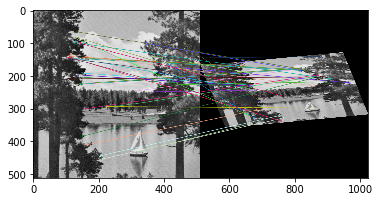

4


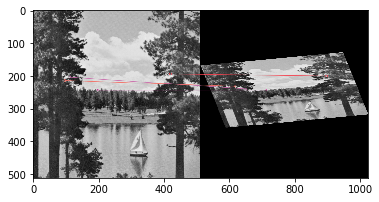

##########################################################################
22


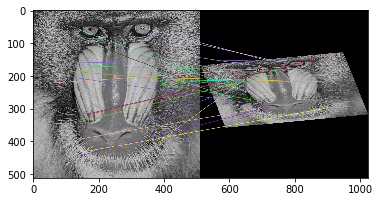

4


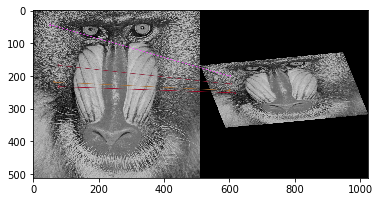

##########################################################################
53


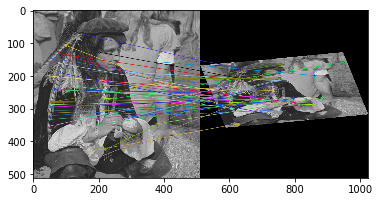

11


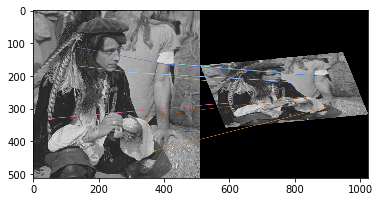

##########################################################################
[[(28, 62), (39, 62), (25, 46), (24, 75), (17, 38), (39, 31), (13, 30), (17, 38), (29, 24), (33, 38), (38, 44)], [(105, 126), (97, 103), (72, 273), (130, 146), (67, 38), (97, 85), (66, 50), (65, 40), (111, 85), (51, 61), (95, 70)], [(131, 56), (102, 36), (133, 68), (176, 74), (152, 62), (115, 20), (140, 58), (144, 53), (115, 21), (159, 84), (141, 44)], [(34, 13), (36, 11), (26, 11), (41, 4), (52, 4), (32, 10), (22, 16), (56, 5), (42, 4), (22, 4), (53, 11)]]


In [26]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1
method_goods=[]
for root,dirs,files in os.walk("../standard_test_images"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    print("********************************************************************")
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file, 0) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file, 0)
        even += 1
        
        orb = cv2.ORB_create(nfeatures=1500)
        kp1, des1 = orb.detectAndCompute(img1, None)
        kp2, des2 = orb.detectAndCompute(img2, None)
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
        one_good_pair=()
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()

        desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
        desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

        bf = cv2.BFMatcher()
        matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        method_goods.append(one_good_pair)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)

        plt.imshow(img3),plt.show()
        print("##########################################################################")
    all_good_matches.append(method_goods)
    print(all_good_matches)

********************************************************************
23


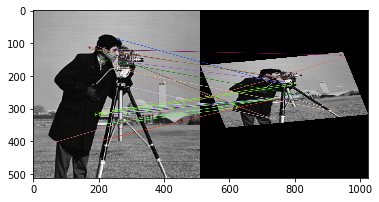

36


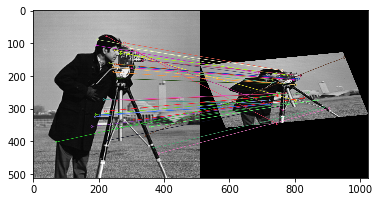

##########################################################################
31


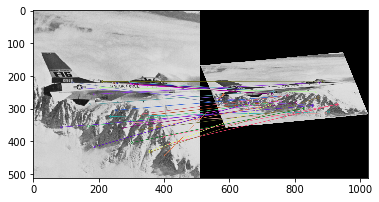

26


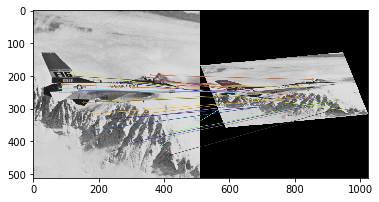

##########################################################################
20


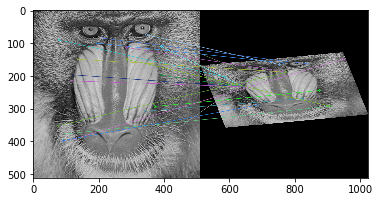

11


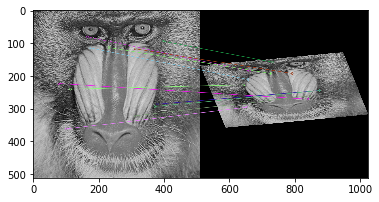

##########################################################################
15


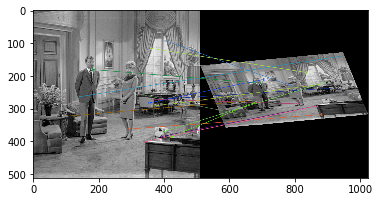

19


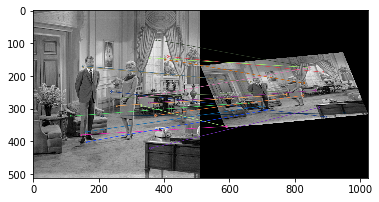

##########################################################################
14


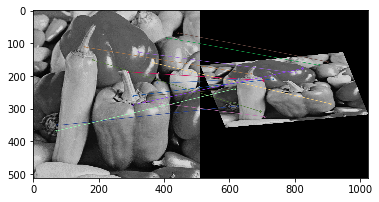

18


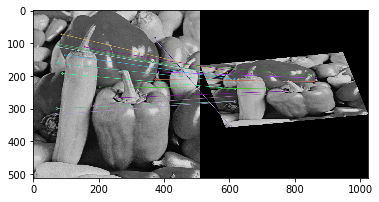

##########################################################################
22


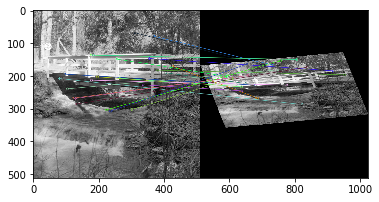

19


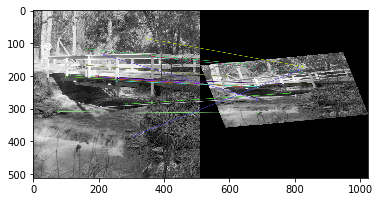

##########################################################################
7


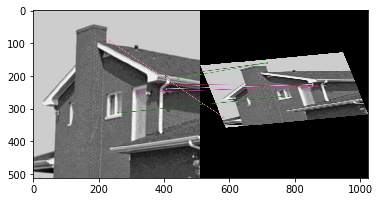

10


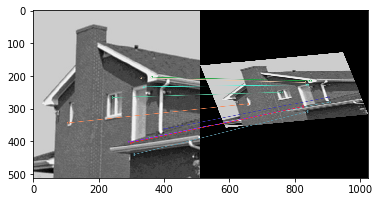

##########################################################################
15


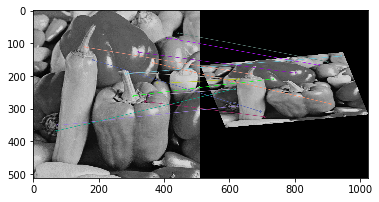

18


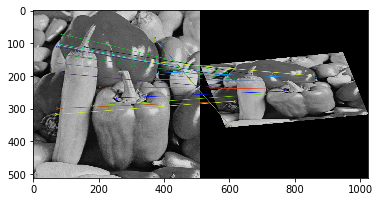

##########################################################################
27


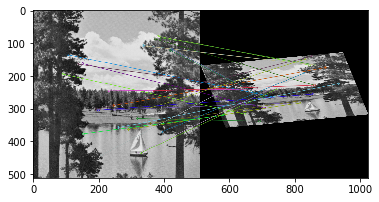

14


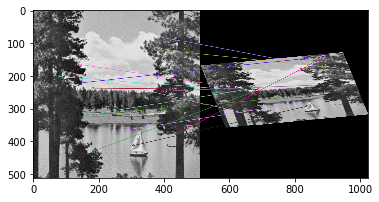

##########################################################################
22


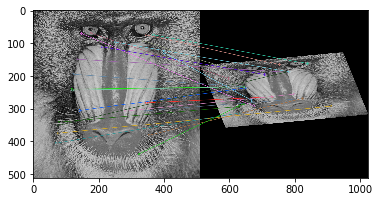

11


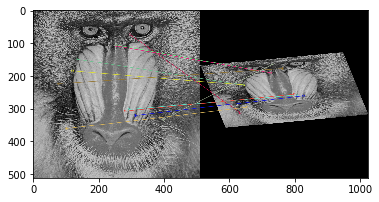

##########################################################################
17


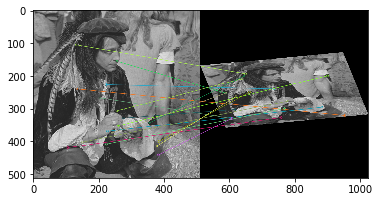

22


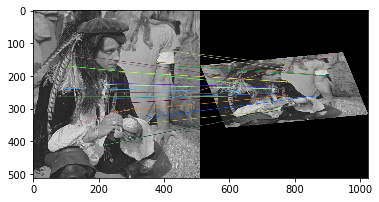

##########################################################################
[[(28, 62), (39, 62), (25, 46), (24, 75), (17, 38), (39, 31), (13, 30), (17, 38), (29, 24), (33, 38), (38, 44)], [(105, 126), (97, 103), (72, 273), (130, 146), (67, 38), (97, 85), (66, 50), (65, 40), (111, 85), (51, 61), (95, 70)], [(131, 56), (102, 36), (133, 68), (176, 74), (152, 62), (115, 20), (140, 58), (144, 53), (115, 21), (159, 84), (141, 44)], [(34, 13), (36, 11), (26, 11), (41, 4), (52, 4), (32, 10), (22, 16), (56, 5), (42, 4), (22, 4), (53, 11)], [(23, 36), (31, 26), (20, 11), (15, 19), (14, 18), (22, 19), (7, 10), (15, 18), (27, 14), (22, 11), (17, 22)]]


In [27]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1
method_goods=[]
for root,dirs,files in os.walk("../standard_test_images"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    print("********************************************************************")
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file, 0) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file, 0)
        even += 1
        
        # Initiate FAST detector
        star = cv2.xfeatures2d.StarDetector_create()
        # Initiate BRIEF extractor
        brief = cv2.xfeatures2d.BriefDescriptorExtractor_create()
        # find the keypoints with STAR
        kp1 = star.detect(img1,None)
        kp2 = star.detect(img2,None)
        # compute the descriptors with BRIEF
        kp1, des1 = brief.compute(img1, kp1)
        kp2, des2 = brief.compute(img2, kp2)
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
        one_good_pair=()
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()

        desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
        desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

        bf = cv2.BFMatcher()
        matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        method_goods.append(one_good_pair)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)

        plt.imshow(img3),plt.show()
        print("##########################################################################")
    all_good_matches.append(method_goods)
    print(all_good_matches)

********************************************************************
1109


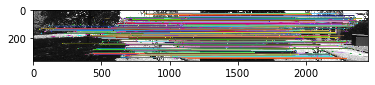

2110


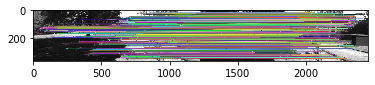

##########################################################################
875


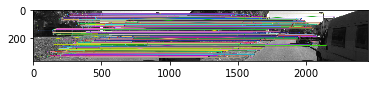

1392


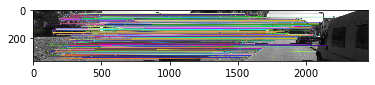

##########################################################################
1626


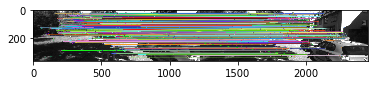

2698


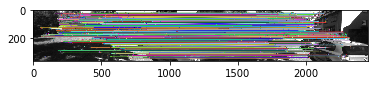

##########################################################################
1400


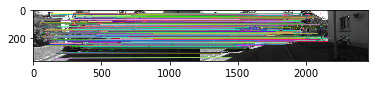

2120


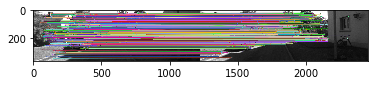

##########################################################################
510


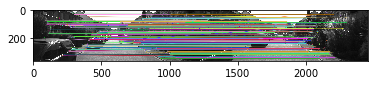

1042


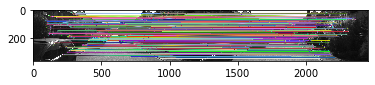

##########################################################################
566


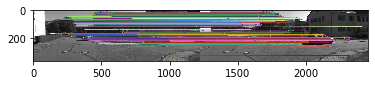

781


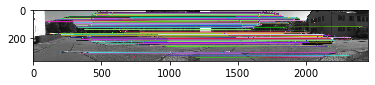

##########################################################################
988


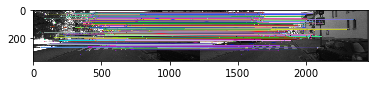

1653


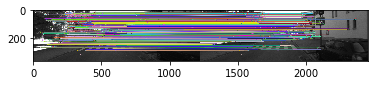

##########################################################################
565


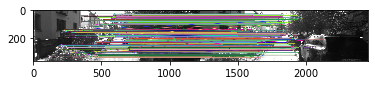

1224


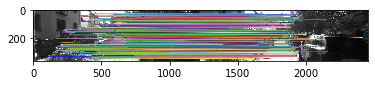

##########################################################################
963


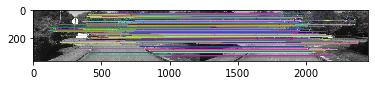

1448


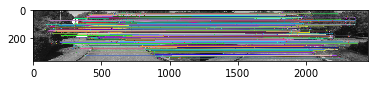

##########################################################################
1050


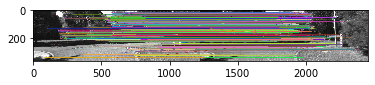

1749


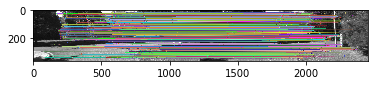

##########################################################################
648


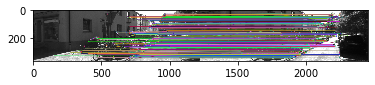

1203


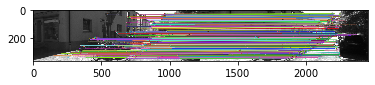

##########################################################################
1248


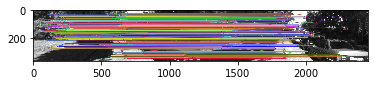

2077


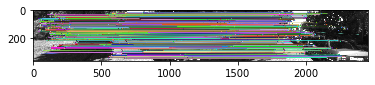

##########################################################################
[[(1109, 2110), (875, 1392), (1626, 2698), (1400, 2120), (510, 1042), (566, 781), (988, 1653), (565, 1224), (963, 1448), (1050, 1749), (648, 1203), (1248, 2077)]]


In [5]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1
method_goods=[]
for root,dirs,files in os.walk("./test"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    print("********************************************************************")
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file, 0) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file, 0)
        even += 1
        
        brisk = cv2.BRISK_create()
        kp1, des1 = brisk.detectAndCompute(img1,None)
        kp2, des2 = brisk.detectAndCompute(img2,None)

        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
        one_good_pair=()
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good)) 
        one_good_pair = one_good_pair + (len(good),)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()

        desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
        desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

        bf = cv2.BFMatcher(cv2.NORM_L2)
        matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        method_goods.append(one_good_pair)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()
        print("##########################################################################")
    all_good_matches.append(method_goods)
    print(all_good_matches)

********************************************************************
1074


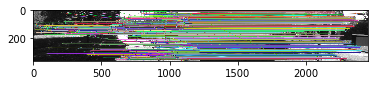

932


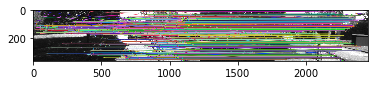

##########################################################################
1094


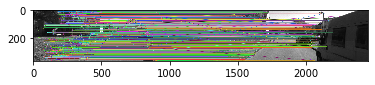

772


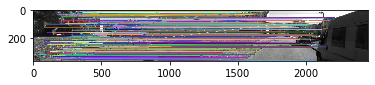

##########################################################################
1497


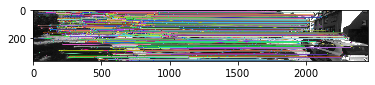

1107


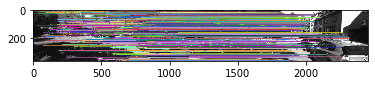

##########################################################################
1292


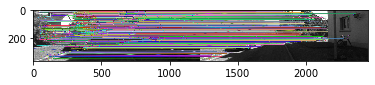

980


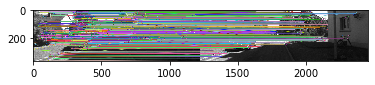

##########################################################################
540


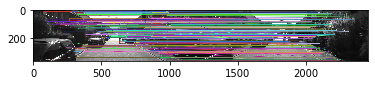

424


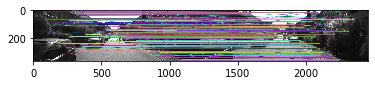

##########################################################################
599


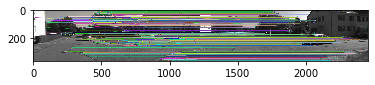

514


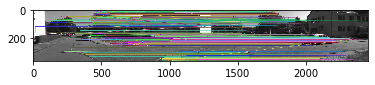

##########################################################################
888


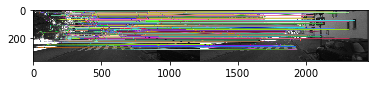

742


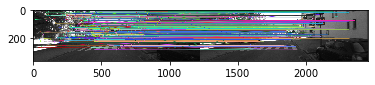

##########################################################################
541


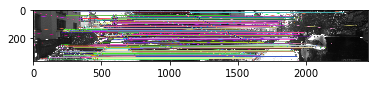

414


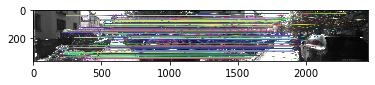

##########################################################################
1424


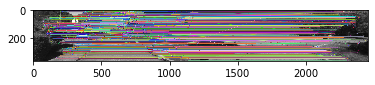

1052


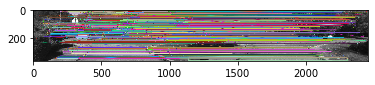

##########################################################################
1146


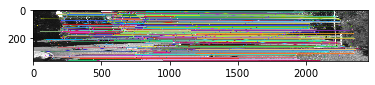

746


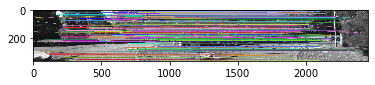

##########################################################################
629


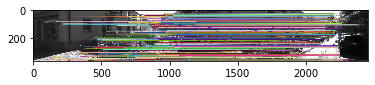

498


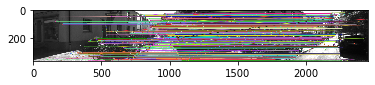

##########################################################################
1262


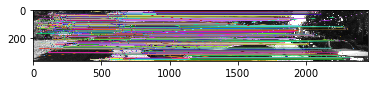

979


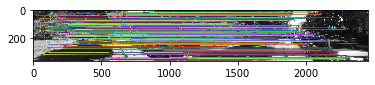

##########################################################################
[[(1109, 2110), (875, 1392), (1626, 2698), (1400, 2120), (510, 1042), (566, 781), (988, 1653), (565, 1224), (963, 1448), (1050, 1749), (648, 1203), (1248, 2077)], [(1074, 932), (1094, 772), (1497, 1107), (1292, 980), (540, 424), (599, 514), (888, 742), (541, 414), (1424, 1052), (1146, 746), (629, 498), (1262, 979)]]


In [6]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1
method_goods=[]
for root,dirs,files in os.walk("./test"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    print("********************************************************************")
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file, 0) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file, 0)
        even += 1
        
        sift = cv2.xfeatures2d.SIFT_create()
        kp1, des1 = sift.detectAndCompute(img1,None)
        kp2, des2 = sift.detectAndCompute(img2,None)
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
        one_good_pair=()
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()

        desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
        desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

        bf = cv2.BFMatcher()
        matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        method_goods.append(one_good_pair)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)

        plt.imshow(img3),plt.show()
        print("##########################################################################")
    all_good_matches.append(method_goods)
    print(all_good_matches)

********************************************************************
1149


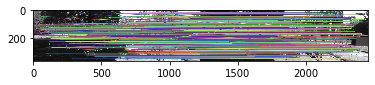

1236


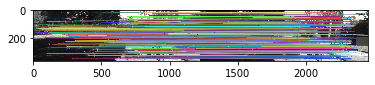

##########################################################################
1104


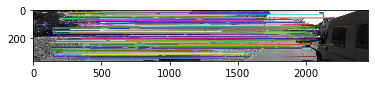

1158


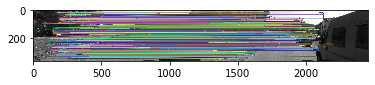

##########################################################################
1355


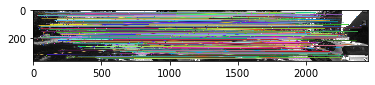

1495


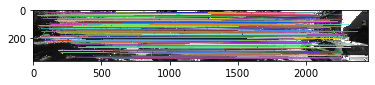

##########################################################################
1412


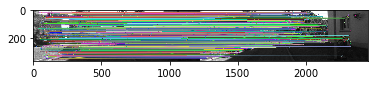

1464


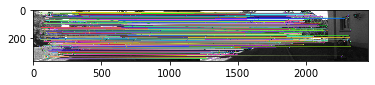

##########################################################################
778


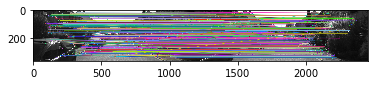

886


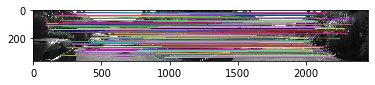

##########################################################################
1168


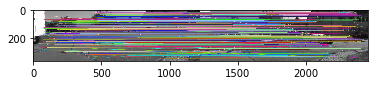

1196


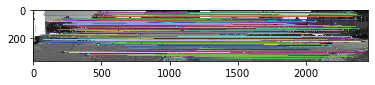

##########################################################################
968


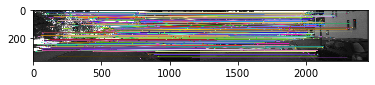

1024


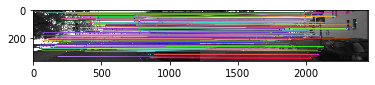

##########################################################################
585


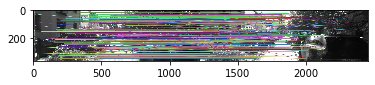

625


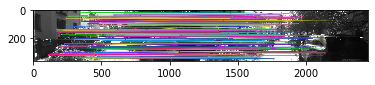

##########################################################################
1389


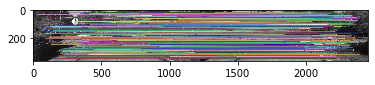

1488


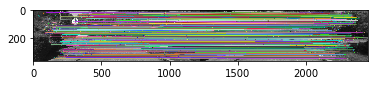

##########################################################################
1248


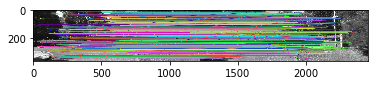

1298


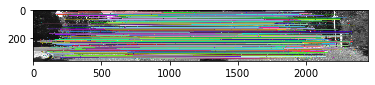

##########################################################################
780


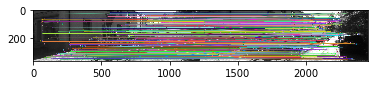

855


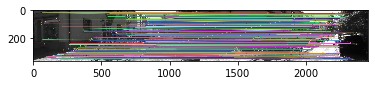

##########################################################################
993


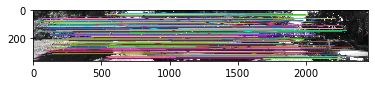

1085


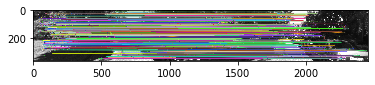

##########################################################################
[[(1109, 2110), (875, 1392), (1626, 2698), (1400, 2120), (510, 1042), (566, 781), (988, 1653), (565, 1224), (963, 1448), (1050, 1749), (648, 1203), (1248, 2077)], [(1074, 932), (1094, 772), (1497, 1107), (1292, 980), (540, 424), (599, 514), (888, 742), (541, 414), (1424, 1052), (1146, 746), (629, 498), (1262, 979)], [(1149, 1236), (1104, 1158), (1355, 1495), (1412, 1464), (778, 886), (1168, 1196), (968, 1024), (585, 625), (1389, 1488), (1248, 1298), (780, 855), (993, 1085)]]


In [7]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1
method_goods=[]
for root,dirs,files in os.walk("./test"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    print("********************************************************************")
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file, 0) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file, 0)
        even += 1
        
        surf = cv2.xfeatures2d.SURF_create()
        kp1, des1 = surf.detectAndCompute(img1,None)
        kp2, des2 = surf.detectAndCompute(img2,None)
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
        one_good_pair=()
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()

        desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
        desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

        bf = cv2.BFMatcher()
        matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        method_goods.append(one_good_pair)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)

        plt.imshow(img3),plt.show()
        print("##########################################################################")
    all_good_matches.append(method_goods)
    print(all_good_matches)

********************************************************************
185


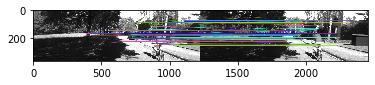

276


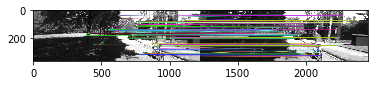

##########################################################################
419


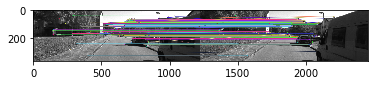

526


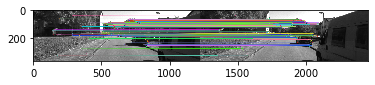

##########################################################################
271


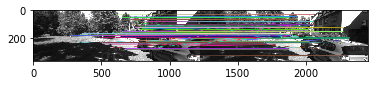

416


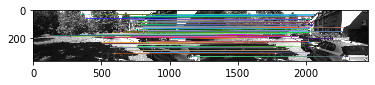

##########################################################################
378


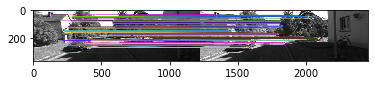

553


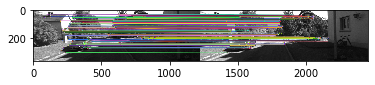

##########################################################################
193


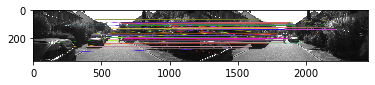

334


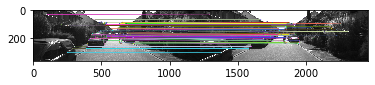

##########################################################################
457


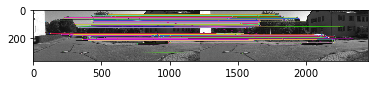

703


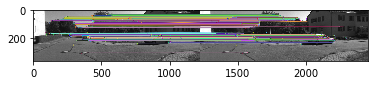

##########################################################################
209


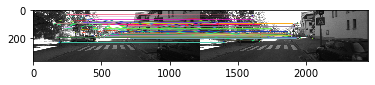

298


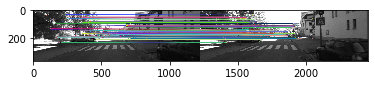

##########################################################################
121


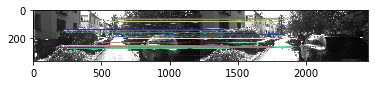

214


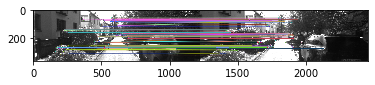

##########################################################################
414


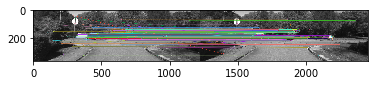

590


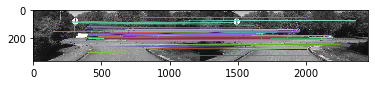

##########################################################################
264


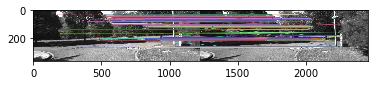

351


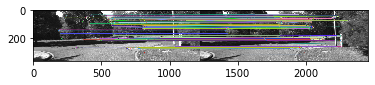

##########################################################################
154


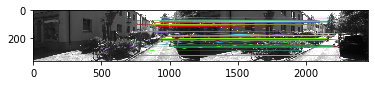

266


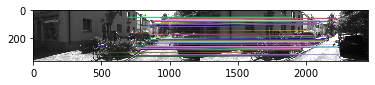

##########################################################################
151


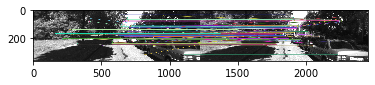

215


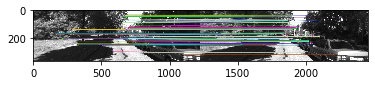

##########################################################################
[[(1109, 2110), (875, 1392), (1626, 2698), (1400, 2120), (510, 1042), (566, 781), (988, 1653), (565, 1224), (963, 1448), (1050, 1749), (648, 1203), (1248, 2077)], [(1074, 932), (1094, 772), (1497, 1107), (1292, 980), (540, 424), (599, 514), (888, 742), (541, 414), (1424, 1052), (1146, 746), (629, 498), (1262, 979)], [(1149, 1236), (1104, 1158), (1355, 1495), (1412, 1464), (778, 886), (1168, 1196), (968, 1024), (585, 625), (1389, 1488), (1248, 1298), (780, 855), (993, 1085)], [(185, 276), (419, 526), (271, 416), (378, 553), (193, 334), (457, 703), (209, 298), (121, 214), (414, 590), (264, 351), (154, 266), (151, 215)]]


In [8]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1
method_goods=[]
for root,dirs,files in os.walk("./test"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    print("********************************************************************")
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file, 0) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file, 0)
        even += 1
        
        orb = cv2.ORB_create(nfeatures=1500)
        kp1, des1 = orb.detectAndCompute(img1, None)
        kp2, des2 = orb.detectAndCompute(img2, None)
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
        one_good_pair=()
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()

        desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
        desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

        bf = cv2.BFMatcher()
        matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        method_goods.append(one_good_pair)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)

        plt.imshow(img3),plt.show()
        print("##########################################################################")
    all_good_matches.append(method_goods)
    print(all_good_matches)

********************************************************************
236


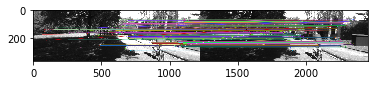

298


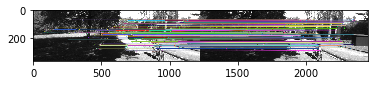

##########################################################################
175


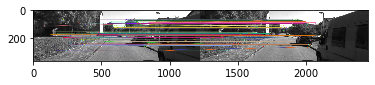

205


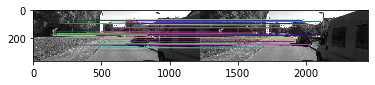

##########################################################################
249


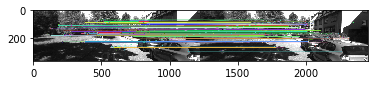

305


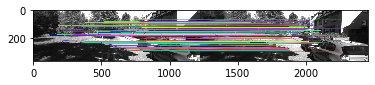

##########################################################################
229


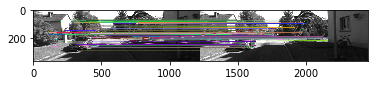

284


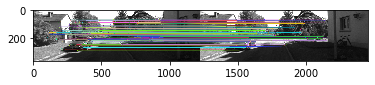

##########################################################################
124


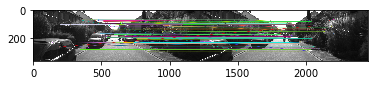

174


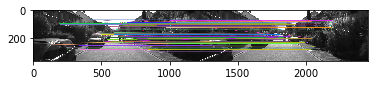

##########################################################################
117


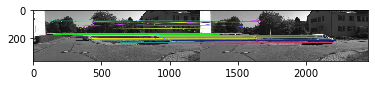

135


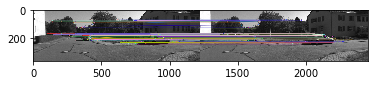

##########################################################################
286


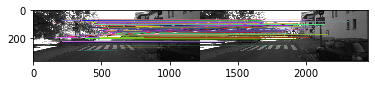

334


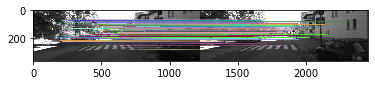

##########################################################################
155


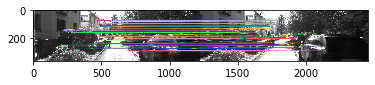

228


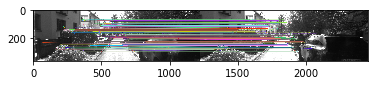

##########################################################################
148


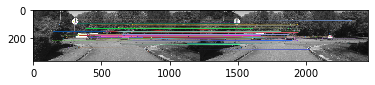

181


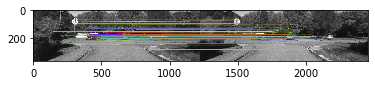

##########################################################################
143


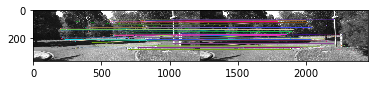

167


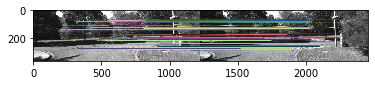

##########################################################################
117


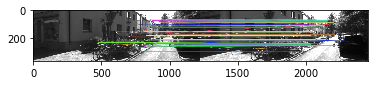

169


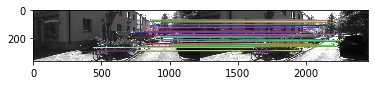

##########################################################################
275


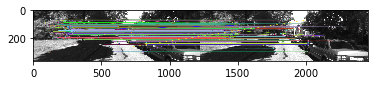

358


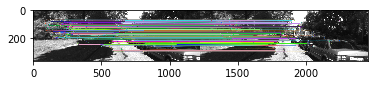

##########################################################################
[[(1109, 2110), (875, 1392), (1626, 2698), (1400, 2120), (510, 1042), (566, 781), (988, 1653), (565, 1224), (963, 1448), (1050, 1749), (648, 1203), (1248, 2077)], [(1074, 932), (1094, 772), (1497, 1107), (1292, 980), (540, 424), (599, 514), (888, 742), (541, 414), (1424, 1052), (1146, 746), (629, 498), (1262, 979)], [(1149, 1236), (1104, 1158), (1355, 1495), (1412, 1464), (778, 886), (1168, 1196), (968, 1024), (585, 625), (1389, 1488), (1248, 1298), (780, 855), (993, 1085)], [(185, 276), (419, 526), (271, 416), (378, 553), (193, 334), (457, 703), (209, 298), (121, 214), (414, 590), (264, 351), (154, 266), (151, 215)], [(236, 298), (175, 205), (249, 305), (229, 284), (124, 174), (117, 135), (286, 334), (155, 228), (148, 181), (143, 167), (117, 169), (275, 358)]]


In [9]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1
method_goods=[]
for root,dirs,files in os.walk("./test"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    print("********************************************************************")
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file, 0) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file, 0)
        even += 1
        
        # Initiate FAST detector
        star = cv2.xfeatures2d.StarDetector_create()
        # Initiate BRIEF extractor
        brief = cv2.xfeatures2d.BriefDescriptorExtractor_create()
        # find the keypoints with STAR
        kp1 = star.detect(img1,None)
        kp2 = star.detect(img2,None)
        # compute the descriptors with BRIEF
        kp1, des1 = brief.compute(img1, kp1)
        kp2, des2 = brief.compute(img2, kp2)
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
        one_good_pair=()
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()

        desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
        desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

        bf = cv2.BFMatcher()
        matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        method_goods.append(one_good_pair)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)

        plt.imshow(img3),plt.show()
        print("##########################################################################")
    all_good_matches.append(method_goods)
    print(all_good_matches)